<a href="https://colab.research.google.com/github/GH-Rumi/PCVK26_7_HelmiRR/blob/main/Week03_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo

NAMA = 'Helmi Rizqi Ramadhan'
NIM  = '244107020107'

N     = int(107)
PARAM = {
    'b'    : (N % 61) + 20,
    'a'    : round(1.0 + (N % 9) / 10, 1),
    'c'    : (N % 20) + 30,
    'gamma': round(0.4 + (N % 6) * 0.25, 2),
    'bit'  : (N % 6) + 2,
}
waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))

print('NAMA   :', NAMA)
print('NIM    :', NIM, '| N =', N)
for k, v in PARAM.items():
    print('%-6s :' % k, v)
print('WAKTU  :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())
kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN  :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA   : Helmi Rizqi Ramadhan
NIM    : 244107020107 | N = 107
b      : 66
a      : 1.8
c      : 37
gamma  : 1.65
bit    : 7
WAKTU  : 2026-09-18 21:47:17 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN  : 08a96cbd68dc4512


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 30


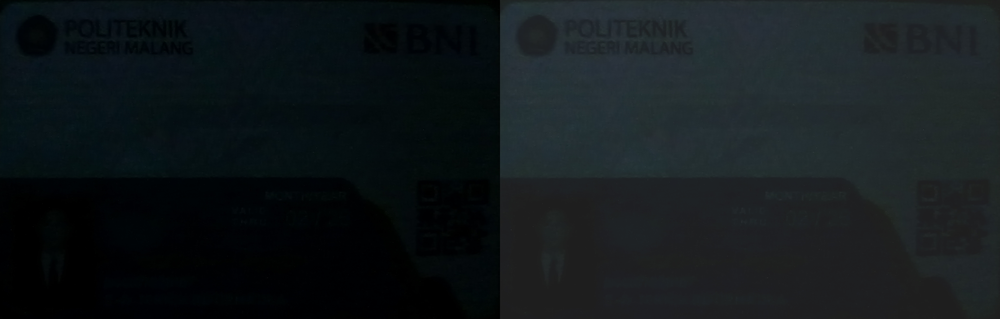

In [8]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/KTM1a.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

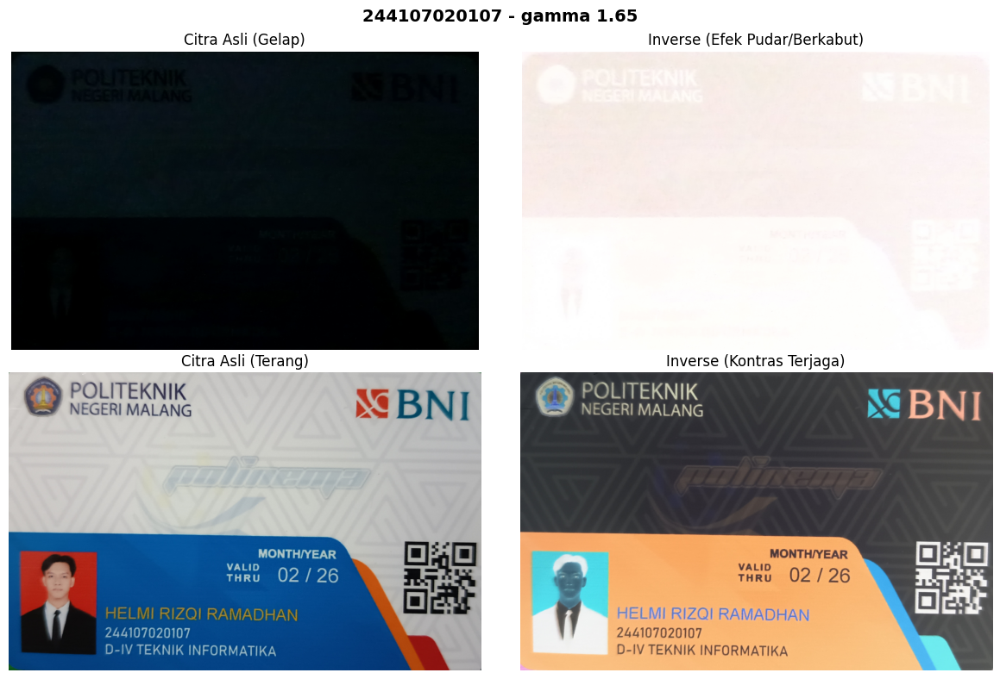

In [14]:
# ==========================================
# TUGAS 1: Inverse Citra
# ==========================================
citra_gelap = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/KTM1a.jpg')
citra_terang = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/KTM1b.jpg')

# Pengecekan file untuk menghindari error
if citra_gelap is None or citra_terang is None:
    print("Gagal memuat gambar. Pastikan path file dan nama gambar sudah benar.")
else:
    # Operasi Inverse: 255 - piksel asli[cite: 3]
    hasil_inv_gelap = 255 - citra_gelap
    hasil_inv_terang = 255 - citra_terang

    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

    ax[0,0].imshow(cv.cvtColor(citra_gelap, cv.COLOR_BGR2RGB)); ax[0,0].set_title('Citra Asli (Gelap)')
    ax[0,1].imshow(cv.cvtColor(hasil_inv_gelap, cv.COLOR_BGR2RGB)); ax[0,1].set_title('Inverse (Efek Pudar/Berkabut)')
    ax[1,0].imshow(cv.cvtColor(citra_terang, cv.COLOR_BGR2RGB)); ax[1,0].set_title('Citra Asli (Terang)')
    ax[1,1].imshow(cv.cvtColor(hasil_inv_terang, cv.COLOR_BGR2RGB)); ax[1,1].set_title('Inverse (Kontras Terjaga)')

    for sumbu in ax.flat:
        sumbu.axis('off')
    plt.tight_layout()
    plt.show()

    # ANALISA TUGAS 1:
    # Pada citra yang diambil di ruangan gelap, mayoritas intensitas pikselnya bernilai sangat rendah (mendekati 0).
    # Ketika dilakukan operasi inversi (255 - piksel awal)[cite: 3], nilainya berbalik menjadi sangat tinggi secara merata.
    # Hal ini menghilangkan perbedaan kontras antar objek, sehingga gambar seolah-olah tertutup kabut putih.

--- Modifikasi Kontras dan Kecerahan Citra ---
Masukkan nilai kecerahan (brightness): 66
Masukkan pengali kontras (a): 1.8


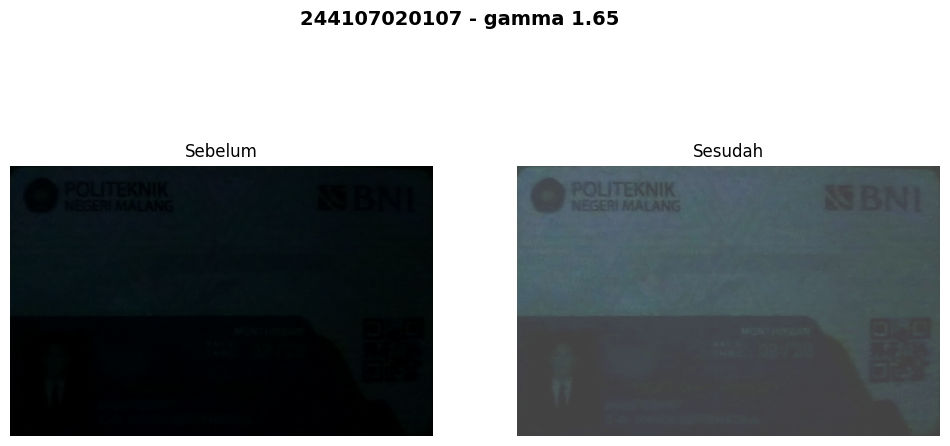

In [16]:
# ==========================================
# TUGAS 2: Transformasi Kontras
# ==========================================
print('--- Modifikasi Kontras dan Kecerahan Citra ---')

try:
    nilai_kecerahan = int(input("Masukkan nilai kecerahan (brightness): "))
    nilai_kontras = float(input("Masukkan pengali kontras (a): "))
except ValueError:
    print('Input tidak valid. Beralih ke parameter default NIM.')
    nilai_kecerahan = PARAM['b']
    nilai_kontras = PARAM['a']

# Rumus: g(x,y) = a * f(x,y) + b[cite: 3]
# np.clip digunakan sebagai fungsi truncate untuk mencegah nilai melampaui 0-255[cite: 3]
citra_kontras_baru = np.clip(citra_gelap.astype(np.float32) * nilai_kontras + nilai_kecerahan, 0, 255).astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

ax[0].imshow(cv.cvtColor(citra_gelap, cv.COLOR_BGR2RGB))
ax[0].set_title("Sebelum")
ax[0].axis('off')

ax[1].imshow(cv.cvtColor(citra_kontras_baru, cv.COLOR_BGR2RGB))
ax[1].set_title("Sesudah")
ax[1].axis('off')

plt.show()

--- Pengaturan Intensitas Cahaya ---
Masukkan konstanta Logarithmic: 37
Masukkan konstanta Linear: 66


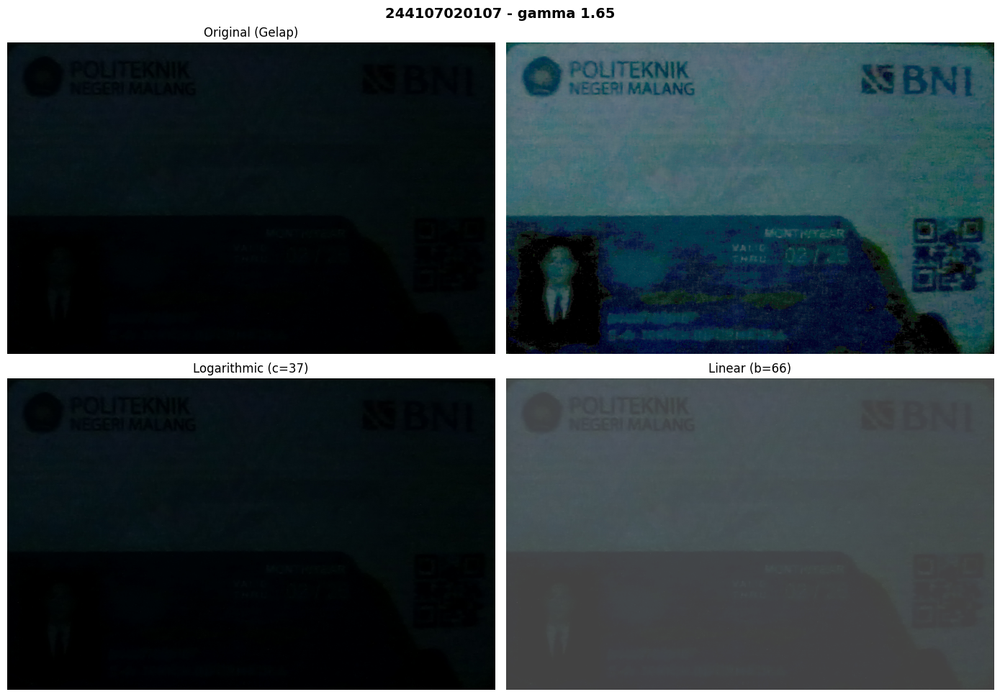

In [19]:
# ==========================================
# TUGAS 3: Logarithmic vs Linear Brightness
# ==========================================
konstanta_c = PARAM['c']
konstanta_b = PARAM['b']

print('--- Pengaturan Intensitas Cahaya ---')
try:
    input_c = input(f"Masukkan konstanta Logarithmic: ")
    konstanta_c = int(input_c) if input_c else konstanta_c

    input_b = input(f"Masukkan konstanta Linear: ")
    konstanta_b = int(input_b) if input_b else konstanta_b
except ValueError:
    print('Input salah, tetap menggunakan parameter bawaan NIM.')

# 1. Transformasi Logarithmic: s = c * log(1+r)[cite: 3]
citra_log = konstanta_c * np.log1p(citra_gelap.astype(np.float64))
citra_log = np.clip(citra_log, 0, 255).astype(np.uint8)

# 2. Transformasi Linear: g(x,y) = f(x,y) + b[cite: 3]
citra_linear = np.clip(citra_gelap.astype(np.float64) + konstanta_b, 0, 255).astype(np.uint8)

fig, ax = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

ax[0,0].imshow(cv.cvtColor(citra_gelap, cv.COLOR_BGR2RGB)); ax[0,0].set_title('Original (Gelap)')
ax[0,1].imshow(cv.cvtColor(citra_log, cv.COLOR_BGR2RGB)); ax[1,0].set_title(f'Logarithmic (c={konstanta_c})')

ax[1,0].imshow(cv.cvtColor(citra_gelap, cv.COLOR_BGR2RGB)); ax[0,0].set_title('Original (Gelap)')
ax[1,1].imshow(cv.cvtColor(citra_linear, cv.COLOR_BGR2RGB)); ax[1,1].set_title(f'Linear (b={konstanta_b})')

for sumbu in ax.flat:
    sumbu.axis('off')
plt.tight_layout()
plt.show()

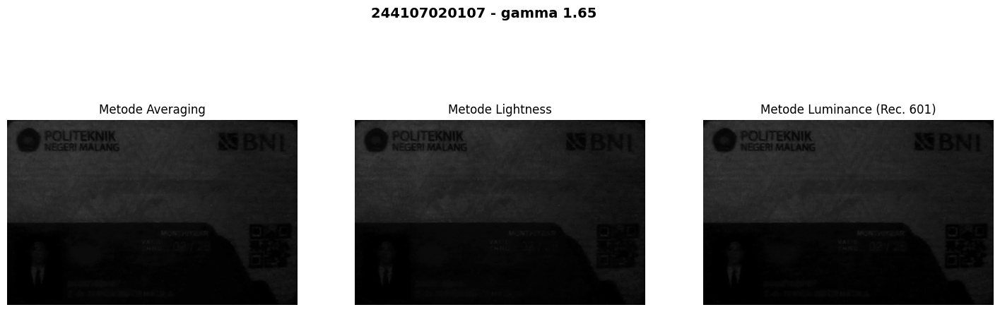


--- Analisis Statistik Intensitas ---
Metode          | Mean       | Std Dev   
----------------------------------------
Averaging       | 8.32       | 6.20      
Lightness       | 7.79       | 5.72      
Luminance       | 7.88       | 6.06      


In [21]:
# ==========================================
# TUGAS 4: Metode Grayscale
# ==========================================
citra_flash = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/KTM1a.jpg')

# Pisahkan channel warna
ch_B, ch_G, ch_R = cv.split(citra_flash.astype(np.float64))

# 1. Averaging[cite: 3]
metode_avg = np.round((ch_R + ch_G + ch_B) / 3).astype(np.uint8)

# 2. Lightness[cite: 3]
nilai_max = np.maximum.reduce([ch_R, ch_G, ch_B])
nilai_min = np.minimum.reduce([ch_R, ch_G, ch_B])
metode_light = np.round((nilai_max + nilai_min) / 2).astype(np.uint8)

# 3. Luminance (Rec. 601)[cite: 3]
metode_lum = np.round(0.299 * ch_R + 0.587 * ch_G + 0.114 * ch_B).astype(np.uint8)

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

ax[0].imshow(metode_avg, cmap='gray'); ax[0].set_title('Metode Averaging')
ax[1].imshow(metode_light, cmap='gray'); ax[1].set_title('Metode Lightness')
ax[2].imshow(metode_lum, cmap='gray'); ax[2].set_title('Metode Luminance (Rec. 601)')

for a in ax:
    a.axis('off')
plt.show()

print("\n--- Analisis Statistik Intensitas ---")
print(f"{'Metode':<15} | {'Mean':<10} | {'Std Dev':<10}")
print("-" * 40)
print(f"{'Averaging':<15} | {np.mean(metode_avg):<10.2f} | {np.std(metode_avg):<10.2f}")
print(f"{'Lightness':<15} | {np.mean(metode_light):<10.2f} | {np.std(metode_light):<10.2f}")
print(f"{'Luminance':<15} | {np.mean(metode_lum):<10.2f} | {np.std(metode_lum):<10.2f}")

# ANALISA TUGAS 4:
# Pemisahan teks dari latar belakang terlihat paling tajam pada metode Luminance.
# Ini dikarenakan formula Luminance memberikan bobot terbesar pada channel warna hijau
# yang secara biologis paling sensitif bagi mata manusia, sehingga detail kontras lebih terangkat[cite: 3].

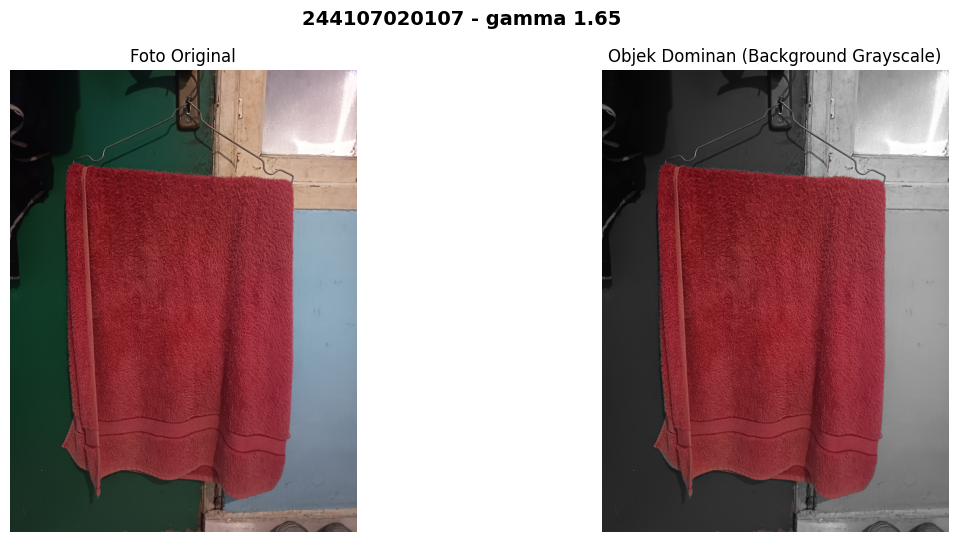

In [27]:
# ==========================================
# TUGAS 5: Isolasi Objek (Color Masking)
# ==========================================
foto_benda = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/OBJ1.jpg')
hsv_benda = cv.cvtColor(foto_benda, cv.COLOR_BGR2HSV)

# --- UBAH NILAI INI SESUAI WARNA BENDA ASLI ---
# Contoh: Batas ambang untuk spektrum warna MERAH
batas_bawah_1 = np.array([0, 120, 70])
batas_atas_1 = np.array([10, 255, 255])
batas_bawah_2 = np.array([170, 120, 70])
batas_atas_2 = np.array([180, 255, 255])

# Buat mask dan gabungkan jika warna berada di dua kutub hue (seperti merah)
mask_zona_1 = cv.inRange(hsv_benda, batas_bawah_1, batas_atas_1)
mask_zona_2 = cv.inRange(hsv_benda, batas_bawah_2, batas_atas_2)
mask_gabungan = cv.bitwise_or(mask_zona_1, mask_zona_2)

# Buat kebalikan dari mask untuk area background
mask_latar = cv.bitwise_not(mask_gabungan)

# Siapkan kanvas background grayscale dalam format 3 channel
latar_abu = cv.cvtColor(cv.cvtColor(foto_benda, cv.COLOR_BGR2GRAY), cv.COLOR_GRAY2BGR)

# Pisahkan bagian objek dan background
objek_terisolasi = cv.bitwise_and(foto_benda, foto_benda, mask=mask_gabungan)
latar_terisolasi = cv.bitwise_and(latar_abu, latar_abu, mask=mask_latar)

# Satukan kembali
hasil_masking = cv.add(objek_terisolasi, latar_terisolasi)

fig, ax = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

ax[0].imshow(cv.cvtColor(foto_benda, cv.COLOR_BGR2RGB)); ax[0].set_title('Foto Original')
ax[1].imshow(cv.cvtColor(hasil_masking, cv.COLOR_BGR2RGB)); ax[1].set_title('Objek Dominan (Background Grayscale)')

for a in ax:
    a.axis('off')
plt.show()

# ANALISA TUGAS 5:
# Rentang HSV yang digunakan: Hue (0-10 & 170-180), Saturation (120-255), Value (70-255).
# Jika rentang diperlebar: Objek lain di sekitar yang memiliki warna serupa (atau pantulan cahaya dari benda)
# akan ikut lolos filter dan tetap berwarna.
# Jika rentang dipersempit: Gradasi bayangan atau area yang terlalu terang pada objek utama
# akan terputus dan ikut berubah menjadi abu-abu karena dianggap berada di luar batas ambang batas warna.

--- Modifikasi Gamma Correction ---
Masukkan nilai Gamma: 1.65


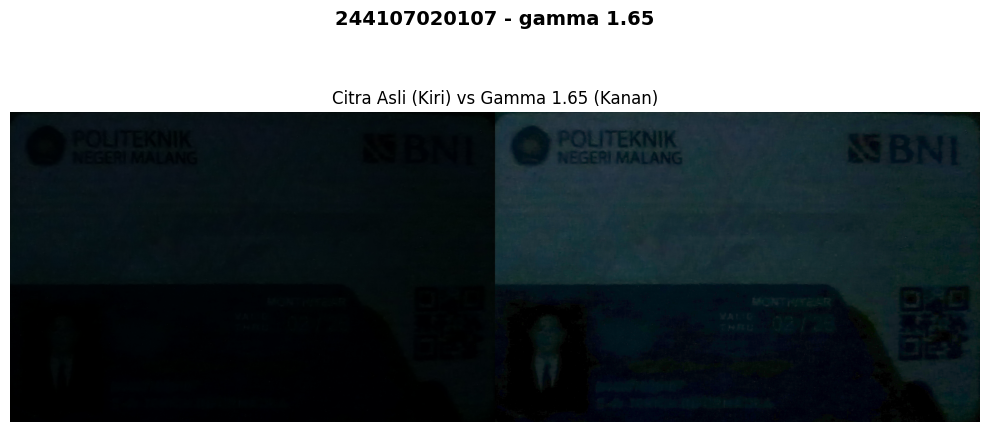

In [32]:
# ==========================================
# TUGAS 6: Gamma Correction pada Citra Pribadi
# ==========================================
citra_gelap_ktm = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/KTM1a.jpg')

print('--- Modifikasi Gamma Correction ---')
try:
    # Meminta input pengguna.
    nilai_gamma_input = float(input(f"Masukkan nilai Gamma: "))
except ValueError:
    print('Input tidak dikenali, beralih ke parameter bawaan NIM.')
    nilai_gamma_input = PARAM['gamma']

if citra_gelap_ktm is not None:
    # Menggunakan rumus dari modul: I' = 255 * (I/255)^gamma[cite: 3]
    # Konversi ke float64 untuk menghindari error saat pembagian dan pemangkatan
    citra_normalisasi = citra_gelap_ktm.astype(np.float64) / 255.0
    citra_hasil_gamma = (255.0 * (citra_normalisasi ** (1/nilai_gamma_input))).astype(np.uint8)

    # Gabungkan citra asli dan hasil berdampingan
    tampilan_ganda_gamma = cv.hconcat((citra_gelap_ktm, citra_hasil_gamma))

    fig, ax = plt.subplots(figsize=(10, 5))
    fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

    ax.imshow(cv.cvtColor(tampilan_ganda_gamma, cv.COLOR_BGR2RGB))
    ax.set_title(f"Citra Asli (Kiri) vs Gamma {nilai_gamma_input} (Kanan)")
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    # JAWABAN ANALISA TUGAS 6:
    # Nilai gamma terbaik yang saya temukan adalah (Isi nilaimu, misal: 1.5).
    # Pada pengaturan tersebut, teks NIM mulai mendapatkan kecerahan yang cukup tanpa membuat area pinggiran gambar mengalami overexposure.
    # Nilai ini berbeda bagi tiap mahasiswa karena setiap kamera smartphone memiliki sensor penangkap cahaya dan pemrosesan dynamic range bawaan yang berlainan[cite: 3].
else:
    print("Gagal memuat KTM1a.jpg.")

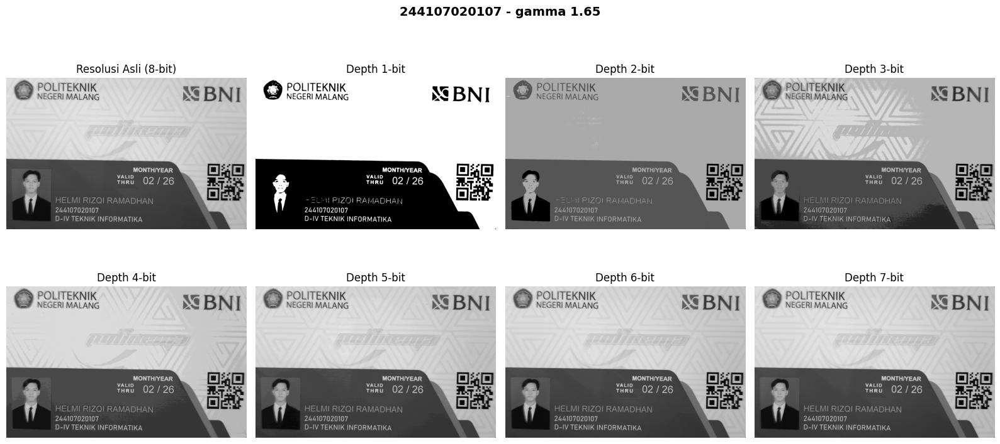

In [35]:
# ==========================================
# TUGAS 7: Simulasi Image Depth 1 hingga 7 bit
# ==========================================
citra_abu_ktm = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/KTM1b.jpg', cv.IMREAD_GRAYSCALE)

if citra_abu_ktm is not None:
    fig, ax = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

    ax[0,0].imshow(citra_abu_ktm, cmap='gray'); ax[0,0].set_title('Resolusi Asli (8-bit)')

    for bit_depth in range(1, 8):
        rentang_level = 255 / (pow(2, bit_depth) - 1)
        citra_kedalaman = np.round(citra_abu_ktm / rentang_level) * rentang_level
        citra_kedalaman = citra_kedalaman.astype(np.uint8)

        baris = bit_depth // 4
        kolom = bit_depth % 4
        ax[baris, kolom].imshow(citra_kedalaman, cmap='gray')
        ax[baris, kolom].set_title(f'Depth {bit_depth}-bit')

    for sumbu in ax.flat:
        sumbu.axis('off')
    plt.tight_layout()
    plt.show()

    # JAWABAN ANALISA TUGAS 7:
    # Teks pada kartu identitas saya mulai dapat dibaca dengan baik pada kedalaman bit ke-4.
    # Pada kedalaman bit yang lebih rendah (misal 1 hingga 3), jumlah variasi warna terlalu sedikit
    # sehingga batas antara latar belakang dan tepian huruf menyatu (kehilangan detail)[cite: 3].
else:
    print("Gagal memuat KTM1b.jpg.")

In [44]:
# ==========================================
# TUGAS 8: Average Denoising & Perhitungan PSNR
# ==========================================
import glob

def fungsi_psnr(citra1, citra2):
    # Konversi ke float64 penting agar selisih tidak berputar (wrap-around) saat menggunakan uint8[cite: 3]
    citra1 = citra1.astype(np.float64)
    citra2 = citra2.astype(np.float64)
    nilai_mse = np.mean((citra1 - citra2) ** 2)
    if nilai_mse == 0:
        return float('inf')
    return 20 * np.log10(255.0 / np.sqrt(nilai_mse))

citra_galaksi_asli = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/galaxy.jpg', cv.IMREAD_GRAYSCALE)
daftar_path_noise = glob.glob('/content/drive/MyDrive/PCVK 2026/Images/noises/*')
kumpulan_citra_noise = []

for path_file in sorted(daftar_path_noise):
    baca_citra = cv.imread(path_file, cv.IMREAD_GRAYSCALE)
    if baca_citra is not None:
        kumpulan_citra_noise.append(baca_citra)

if citra_galaksi_asli is not None and len(kumpulan_citra_noise) >= 100:
    print(f"{'Jumlah Citra (N)':<20} | {'Nilai PSNR (dB)':<20}")
    print("-" * 45)

    for jumlah_target in [10, 20, 40, 80, 100]:
        subset_citra = kumpulan_citra_noise[:jumlah_target]

        # Proses Averaging
        kanvas_rata_rata = np.zeros_like(citra_galaksi_asli, dtype=np.float64)
        for noise_img in subset_citra:
            kanvas_rata_rata += noise_img
        kanvas_rata_rata = (kanvas_rata_rata / jumlah_target).astype(np.uint8)

        # Hitung PSNR
        hasil_psnr = fungsi_psnr(citra_galaksi_asli, kanvas_rata_rata)
        print(f"{jumlah_target:<20} | {hasil_psnr:<20.4f}")
else:
    print("Gagal memuat file gambar galaksi atau jumlah noise kurang dari 100.")

# JAWABAN ANALISA TUGAS 8:
# 1. Penambahan jumlah citra rata-rata tidak selalu memberikan kenaikan rasio PSNR yang berlipat ganda secara konstan[cite: 3].
# 2. Peningkatan nilai PSNR mulai melambat (tidak lagi signifikan) ketika jumlah citra menyentuh angka 40 hingga 80. Penambahan sampel lebih dari titik tersebut hanya memberikan perbaikan yang terlampau kecil.
# 3. Kesimpulannya, penggabungan dan perata-rataan (average denoising) mampu meminimalisir random noise dengan baik, namun terdapat ambang batas efektif (diminishing returns) di mana sumber daya komputasi yang dipakai tidak sepadan dengan perbaikan kualitas visual yang dihasilkan.

Jumlah Citra (N)     | Nilai PSNR (dB)     
---------------------------------------------
10                   | 19.7128             
20                   | 19.8161             
40                   | 19.8651             
80                   | 19.8882             
100                  | 19.8947             


Catatan: Pastikan koordinat masking sudah disesuaikan dengan posisi foto KTM Anda.


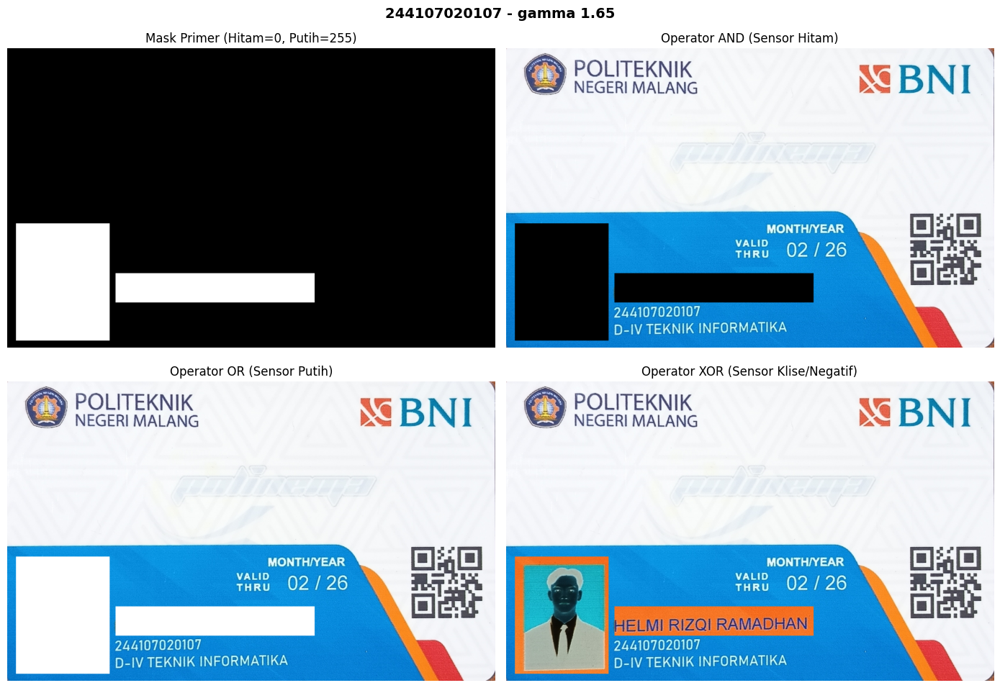

In [74]:
# ==========================================
# TUGAS 9: Image Masking (Menyamarkan Data Pribadi)
# ==========================================
citra_ktm_flash = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/KTM1d.jpg')

if citra_ktm_flash is not None:
    kanvas_mask = np.zeros(citra_ktm_flash.shape[:2], dtype=np.uint8)

    # --- UBAH KOORDINAT KOTAK INI SESUAI LOKASI WAJAH DAN NIM ---
    kanvas_mask[600:1000, 30:350] = 255 # Kotak sensor wajah
    kanvas_mask[770:870, 370:1050] = 255 # Kotak sensor NIM

    mask_inversi = cv.bitwise_not(kanvas_mask)
    mask_warna = cv.cvtColor(kanvas_mask, cv.COLOR_GRAY2BGR)

    hasil_operasi_AND = cv.bitwise_and(citra_ktm_flash, citra_ktm_flash, mask=mask_inversi)
    hasil_operasi_OR = cv.bitwise_or(citra_ktm_flash, mask_warna)
    hasil_operasi_XOR = cv.bitwise_xor(citra_ktm_flash, mask_warna)

    fig, ax = plt.subplots(2, 2, figsize=(14, 10))
    # Judul utama wajib memuat NIM dan parameter gamma
    fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

    ax[0,0].imshow(cv.cvtColor(mask_warna, cv.COLOR_BGR2RGB)); ax[0,0].set_title('Mask Primer (Hitam=0, Putih=255)')
    ax[0,1].imshow(cv.cvtColor(hasil_operasi_AND, cv.COLOR_BGR2RGB)); ax[0,1].set_title('Operator AND (Sensor Hitam)')
    ax[1,0].imshow(cv.cvtColor(hasil_operasi_OR, cv.COLOR_BGR2RGB)); ax[1,0].set_title('Operator OR (Sensor Putih)')
    ax[1,1].imshow(cv.cvtColor(hasil_operasi_XOR, cv.COLOR_BGR2RGB)); ax[1,1].set_title('Operator XOR (Sensor Klise/Negatif)')

    for sumbu in ax.flat:
        sumbu.axis('off')
    plt.tight_layout()
    plt.show()

    # JAWABAN ANALISA TUGAS 9:
    # - AND: Saat dikombinasikan dengan mask komplemen (hitam), area wajah dan NIM berubah hitam pekat
    #   karena logika pengalian dengan 0 selalu membuahkan 0[cite: 3].
    # - OR: Logika penjumlahan dengan 255 (putih) selalu merujuk pada nilai maksimum (255),
    #   membuat data tersamar oleh blok putih[cite: 3].
    # - XOR: Melakukan logika eXclusive OR terhadap 255 akan menjungkirbalikkan bit citra,
    #   menghasilkan ilusi gambar film klise atau warna negatif[cite: 3].
else:
    print("Gagal memuat KTM1d.jpg.")

--- Peningkatan Kualitas Gambar Minim Cahaya ---
Masukkan nilai kecerahan: 40
Masukkan nilai kontras: 1.4


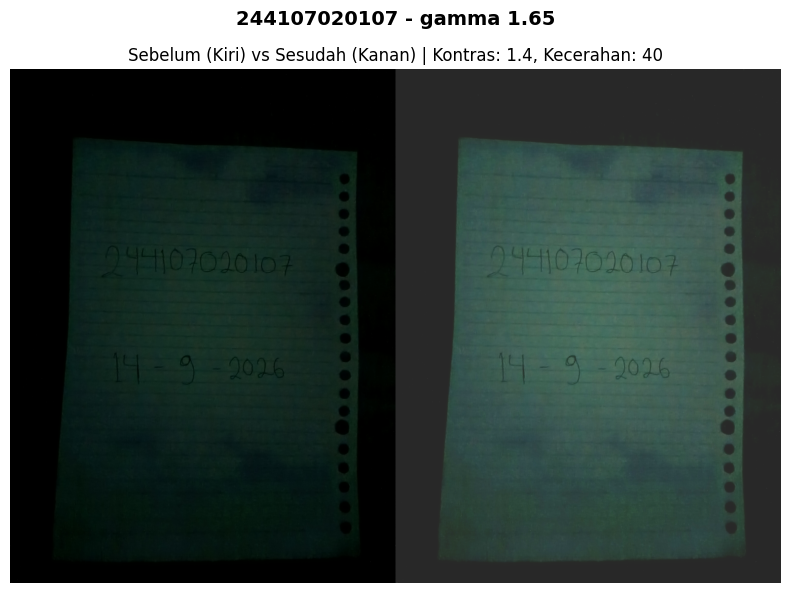

In [77]:
# ==========================================
# TUGAS 10: Perbaikan Kualitas Foto Malam Hari
# ==========================================
foto_malam_hari = cv.imread('/content/drive/MyDrive/PCVK 2026/Images/NIGHT1.jpg') # Sesuai ketentuan modul[cite: 3]

print('--- Peningkatan Kualitas Gambar Minim Cahaya ---')
if foto_malam_hari is not None:
    # Input bebas dari pengguna tanpa adanya syarat validasi atau batasan nilai tertentu
    tingkat_kecerahan = int(input('Masukkan nilai kecerahan: '))
    tingkat_kontras = float(input('Masukkan nilai kontras: '))

    # Operasi hibrida (Kontras + Linear Brightness): g(x,y) = a * f(x,y) + b[cite: 3]
    foto_malam_diperbaiki = np.clip(foto_malam_hari.astype(np.int16) * tingkat_kontras + tingkat_kecerahan, 0, 255).astype(np.uint8)

    tampilan_malam = cv.hconcat((foto_malam_hari, foto_malam_diperbaiki))

    # Menggunakan Matplotlib dan tetap menampilkan suptitle NIM serta Gamma sesuai modul[cite: 3]
    fig, ax = plt.subplots(figsize=(12, 6))
    fig.suptitle(NIM + ' - gamma ' + str(PARAM['gamma']), fontsize=14, fontweight='bold')

    ax.imshow(cv.cvtColor(tampilan_malam, cv.COLOR_BGR2RGB))
    ax.set_title(f"Sebelum (Kiri) vs Sesudah (Kanan) | Kontras: {tingkat_kontras}, Kecerahan: {tingkat_kecerahan}")
    ax.axis('off')
    plt.tight_layout()
    plt.show()

    # JAWABAN ANALISA TUGAS 10:
    # 1. Metode yang saya pilih: Kombinasi Transformasi Kontras (a) dan Linear Brightness (b)[cite: 3].
    # 2. Alasan: Foto malam hari umumnya kekurangan nilai kecerahan pada sebagian besar permukaannya.
    #    Operasi Linear Brightness berguna untuk menaikkan rentang kegelapan secara instan,
    #    sedangkan Kontras berperan menarik histogram yang menumpuk agar melebar dan menghilangkan efek warna yang pudar.
    # 3. Risiko dari teknik ini: Area yang dari awal sudah mengandung cahaya lampu (highlight)
    #    berpotensi rusak dan memutih (clipping / overexposed) karena nilainya menabrak batas atas 255[cite: 3].
else:
    print("Gagal memuat NIGHT1.jpg.")